# Lessons learned

1. Accessing groupby() df is called multiindexing coz it has columns of multiple levels
2. inplace on a df['Attribute'].method() doesn't work because pandas thinks you're making changes to a copy of the df i.e the subset not the actual df

# Importations and Preliminaries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Load the dataset
df = pd.read_csv(r'train.csv')

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,GasA,Ex,

In [4]:
# Get the dimension of the df
df.shape

(1460, 81)

In [5]:
# Obtain a general overview on the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

# Data cleaning

## Missing values

In [6]:
# Identify amount of missing values across each column
na_cols = df.isna().sum()

# Pop the columns whose NaNs = 0
for x in na_cols.index:
    if (na_cols[x] == 0):
        na_cols.pop(x)

# Display them
na_cols

LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

### Lot Frontage

In [7]:
# This refers to the portion of land that is next to a street
# According to a google search, houses in same neighborhood have similar lot frontage
# Compute avg lot frontage for each nbrhood
mean_lf = df.groupby('Neighborhood').agg({'LotFrontage':['count','mean']})
mean_lf

LotFrontage           
                   count       mean
Neighborhood                       
Blmngtn               14  47.142857
Blueste                2  24.000000
BrDale                16  21.562500
BrkSide               51  57.509804
ClearCr               13  83.461538
CollgCr              126  71.682540
Crawfor               41  71.804878
Edwards               92  68.217391
Gilbert               49  79.877551
IDOTRR                34  62.500000
MeadowV               15  27.800000
Mitchel               36  70.083333
NAmes                186  76.462366
NPkVill                7  32.285714
NWAmes                45  81.288889
NoRidge               33  91.878788
NridgHt               76  81.881579
OldTown              109  62.788991
SWISU                 23  58.913043
Sawyer                48  74.437500
SawyerW               50  71.500000
Somerst               78  64.666667
StoneBr               20  62.700000
Timber                30  80.133333
Veenker                7  59.714286

In [8]:
# Store the list of neighborhoods
nbrhoods = df['Neighborhood'].unique()
# Store the LotFrontage rows with NaNs in a Series
lf_rows = df[df['LotFrontage'].isna()].index
# Iterate through each row
for i in lf_rows:
    # Identify its nbrhood
    row_nbrhood = df.loc[i,'Neighborhood']
    row_lf = 0.0
    # Find and store the value of its mean
    for j in nbrhoods:
        if j == row_nbrhood:
            row_lf = mean_lf.loc[row_nbrhood,('LotFrontage','mean')]
            break
    # Fill it into the df
    df.loc[i,'LotFrontage'] = row_lf.round(2)

# Display the df 
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.00,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.00,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.00,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.00,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.00,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.00,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.00,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,81.29,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.00,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.00,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,9

### Alley

In [9]:
# This refers to a narrow lane for pedaestrians to pass through
# It seemed as though there was a relationship bw Alley, Street and Lot Shape -- Turns out I was mistaken
# It has 3 possible values --Grvl, Pave and NA -- Some buildings don't have it
df['Alley'] = df['Alley'].fillna('NA')

### MasVnrType

In [10]:
# This refers to the type of material applied to the outside of a building for aesthetics
# Some buildings don't have MasVnr
df.MasVnrType.unique()

array(['BrkFace', nan, 'Stone', 'BrkCmn'], dtype=object)

In [11]:
df['MasVnrType'] = df['MasVnrType'].fillna('None')
df.MasVnrType.unique()

array(['BrkFace', 'None', 'Stone', 'BrkCmn'], dtype=object)

### MasVnrArea

In [12]:
# This reps the area covered by the Masonry veneer -- Since there wasn't a type applied, no area was covered
df['MasVnrArea'] = df['MasVnrArea'].fillna(0.0)

### BsmtQual

In [13]:
# Evaluation of the basement's height 
# There exists houses with no basement and are represented by NA
df['BsmtQual'] = df['BsmtQual'].fillna('NA')

### BsmtCond

In [14]:
# Evaluation the general basement condition
# There exists houses with no basement and are represented by NA
df['BsmtCond'] = df['BsmtCond'].fillna('NA')

### BsmtExposure

In [15]:
# Refers to how a person walks out of the basement
df['BsmtExposure'].unique()

array(['No', 'Gd', 'Mn', 'Av', nan], dtype=object)

In [16]:
# Fill all NaNs with NA
df['BsmtExposure'] = df['BsmtExposure'].fillna('NA')

### BsmtFinType1

In [17]:
# Rating of the finished Bsmt Area
df['BsmtFinType1'].unique()

array(['GLQ', 'ALQ', 'Unf', 'Rec', 'BLQ', nan, 'LwQ'], dtype=object)

In [18]:
# Fill all NaNs with NA
df['BsmtFinType1'] = df['BsmtFinType1'].fillna('NA')

### BsmtFinType2

In [19]:
# Rating of the finished Bsmt Area -- Another type
df['BsmtFinType2'].unique()

array(['Unf', 'BLQ', nan, 'ALQ', 'Rec', 'LwQ', 'GLQ'], dtype=object)

In [20]:
# Fill all NaNs with NA
df['BsmtFinType2'] = df['BsmtFinType2'].fillna('NA')

### Electrical

In [21]:
# Electrical system type
df[df['Electrical'].isna()]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
1379,1380,80,RL,73.0,9735,Pave,NA,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,SLvl,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,384,384,GasA,Gd,Y,NaN,754,640,0,1394,0,0,2,1,3,1,Gd,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2,400,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,5,2008,WD,Normal,167500


In [22]:
# Getting the actual value is out of the question
# We best settle for the more commonly used one
df['Electrical'].mode()

0    SBrkr
Name: Electrical, dtype: object

In [23]:
df['Electrical'] = df['Electrical'].fillna('SBrkr')

### FireplaceQu

In [24]:
# The quality of the fireplace 
df['FireplaceQu'].unique()

array([nan, 'TA', 'Gd', 'Fa', 'Ex', 'Po'], dtype=object)

In [25]:
df['FireplaceQu'] = df['FireplaceQu'].fillna('NA')

### GarageType

In [26]:
# Type of garage -- There exists houses with no garage
df['GarageType'] = df['GarageType'].fillna('NA')

In [27]:
df['GarageType'].unique()

array(['Attchd', 'Detchd', 'BuiltIn', 'CarPort', 'NA', 'Basment',
       '2Types'], dtype=object)

### GarageYrBlt

In [28]:
# The year the garage was built -- if there's no garage, then it was never built
# Replace NaNs with 0 since they were never built
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(0)

In [29]:
df['GarageYrBlt'].unique()

array([2003., 1976., 2001., 1998., 2000., 1993., 2004., 1973., 1931.,
       1939., 1965., 2005., 1962., 2006., 1960., 1991., 1970., 1967.,
       1958., 1930., 2002., 1968., 2007., 2008., 1957., 1920., 1966.,
       1959., 1995., 1954., 1953.,    0., 1983., 1977., 1997., 1985.,
       1963., 1981., 1964., 1999., 1935., 1990., 1945., 1987., 1989.,
       1915., 1956., 1948., 1974., 2009., 1950., 1961., 1921., 1900.,
       1979., 1951., 1969., 1936., 1975., 1971., 1923., 1984., 1926.,
       1955., 1986., 1988., 1916., 1932., 1972., 1918., 1980., 1924.,
       1996., 1940., 1949., 1994., 1910., 1978., 1982., 1992., 1925.,
       1941., 2010., 1927., 1947., 1937., 1942., 1938., 1952., 1928.,
       1922., 1934., 1906., 1914., 1946., 1908., 1929., 1933.])

### GarageFinish

In [30]:
# The interior finish of the garage
# NA indicates No Garage
df['GarageFinish'] = df['GarageFinish'].fillna('NA')

In [31]:
df['GarageFinish'].unique()

array(['RFn', 'Unf', 'Fin', 'NA'], dtype=object)

### GarageQual

In [32]:
# Garage quality
# NA indicates No Garage
df['GarageQual'] = df['GarageQual'].fillna('NA')

In [33]:
df['GarageQual'].unique()

array(['TA', 'Fa', 'Gd', 'NA', 'Ex', 'Po'], dtype=object)

### GarageCond

In [34]:
# Garage condition
# NA indicates No Garage
df['GarageCond'] = df['GarageCond'].fillna('NA')

In [35]:
df['GarageCond'].unique()

array(['TA', 'Fa', 'NA', 'Gd', 'Po', 'Ex'], dtype=object)

### PoolQC

In [36]:
# Pool quality
# NA indicates No Pool
df['PoolQC'] = df['PoolQC'].fillna('NA')

In [37]:
df['PoolQC'].unique()

array(['NA', 'Ex', 'Fa', 'Gd'], dtype=object)

### Fence

In [38]:
# Fence quality
# NA reps No fence
df['Fence'] = df['Fence'].fillna('NA')

In [39]:
df['Fence'].unique()

array(['NA', 'MnPrv', 'GdWo', 'GdPrv', 'MnWw'], dtype=object)

### MiscFeature

In [40]:
# Some astonishing feature not covered by any other category
# NA reps None
df['MiscFeature'] = df['MiscFeature'].fillna('NA')

In [41]:
df['MiscFeature'].unique()

array(['NA', 'Shed', 'Gar2', 'Othr', 'TenC'], dtype=object)

## Duplicates

In [42]:
# Check for total amount of duplicated entries
df.duplicated().sum()
# No duplicates found thus no removal

np.int64(0)

## Outlier removal

In [43]:
# cols = df.columns
# for i in cols:
    

In [44]:
from scipy.stats.mstats import winsorize
# We're selecting only numerical cols
num_cols = df.select_dtypes('number').columns

# Replacing outlier values
for col in num_cols:
    df[col] = winsorize(df[col], limits=[0.05, 0.05])

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          1460 non-null   object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Encoding

In [46]:
from sklearn.preprocessing import LabelEncoder, StandardScaler

le = LabelEncoder()
ss = StandardScaler()

# Select the categorical cols
cat_cols = df.select_dtypes('object').columns

# We're doing the label encoding
for col in cat_cols:
    df[col] = le.fit_transform(df[col])

# Display the first 10 rows
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,74,60,3,65.00,8450,1,1,3,3,0,4,0,5,2,2,0,5,7,5,2003,2003,1,1,12,13,1,196.0,2,4,2,2,4,4,2,706,6,0,150,856,1,0,1,4,856,854,0,1710,1,0,2,1,3,1,2,8,6,0,3,1,2003.0,2,2,548,5,5,2,0,61,0,0,0,0,3,4,1,0,2,2008,8,4,208500
1,74,20,3,80.00,9600,1,1,3,3,0,2,0,24,1,2,0,2,6,8,1976,1976,1,1,8,8,2,0.0,3,4,1,2,4,1,0,978,6,0,284,1262,1,0,1,4,1262,0,0,1262,0,1,2,0,3,1,3,6,6,1,5,1,1976.0,2,2,460,5,5,2,298,0,0,0,0,0,3,4,1,0,5,2007,8,4,181500
2,74,60,3,68.00,11250,1,1,0,3,0,4,0,5,2,2,0,5,7,5,2001,2002,1,1,12,13,1,162.0,2,4,2,2,4,2,2,486,6,0,434,920,1,0,1,4,920,866,0,1786,1,0,2,1,3,1,2,6,6,1,5,1,2001.0,2,2,608,5,5,2,0,42,0,0,0,0,3,4,1,0,9,2008,8,4,223500
3,74,70,3,60.00,9550,1,1,0,3,0,0,0,6,2,2,0,5,7,5,1916,1970,1,1,13,15,2,0.0,3,4,0,4,1,4,0,216,6,0,540,756,1,2,1,4,961,756,0,1717,1,0,1,0,3,1,2,7,6,1,2,5,1998.0,3,3,642,5,5,2,0,35,180,0,0,0,3,4,1,0,2,2006,8,0,140000
4,74,60,3,84.00,14260,1,1,0,3,0,2,0,15,2,2,0,5,8,5,2000,2000,1,1,12,13,1,350.0,2,4,2,2,4,0,2,655,6,0,490,1145,1,0,1,4,1145,1053,0,2198,1,0,2,1,4,1,2,9,6,1,5,1,2000.0,2,3,836,5,5,2,192,84,0,0,0,0,3,4,1,0,11,2008,8,4,250000
5,74,50,3,85.00,14115,1,1,0,3,0,4,0,11,2,2,0,0,5,5,1993,1995,1,1,12,13,2,0.0,3,4,5,2,4,4,2,732,6,0,64,796,1,0,1,4,796,566,0,1362,1,0,1,1,2,1,3,5,6,0,3,1,1993.0,3,2,480,5,5,2,40,30,0,0,0,0,3,2,3,0,10,2009,8,4,143000
6,74,20,3,75.00,10084,1,1,3,3,0,4,0,21,2,2,0,2,8,5,2004,2005,1,1,12,13,3,186.0,2,4,2,0,4,0,2,1274,6,0,317,1686,1,0,1,4,1694,0,0,1694,1,0,2,0,3,1,2,7,6,1,2,1,2004.0,2,2,636,5,5,2,255,57,0,0,0,0,3,4,1,0,8,2007,8,4,307000
7,74,60,3,81.29,10382,1,1,0,3,0,0,0,14,4,2,0,5,7,6,1973,1973,1,1,6,6,3,240.0,3,4,1,2,4,2,0,859,1,32,216,1107,1,0,1,4,1107,983,0,2090,1,0,2,1,3,1,3,7,6,2,5,1,1973.0,2,2,484,5,5,2,235,175,180,0,0,0,3,4,3,0,11,2009,8,4,200000
8,74,50,4,51.00,6120,1,1,3,3,0,4,0,17,0,2,0,0,7,5,1931,1950,1,1,3,15,2,0.0,3,4,0,4,4,4,6,0,6,0,952,952,1,2,1,1,1022,752,0,1774,0,0,2,0,2,1,3,8,2,2,5,5,1931.0,3,2,468,1,5,2,90,0,180,0,0,0,3,4,1,0,4,2008,8,0,129900
9,74,160,3,50.00,7420,1,1,3,3,0,0,0,3,0,0,1,1,5,6,1939,1950,1,1,8,8,2,0.0,3,4,0,4,4,4,2,851,6,0,140,991,1,0,1,4,1077,0,0,1077,1,0,1,0,2,1,3,5,6,2,5,1,1939.0,2,1,205,2,5,2,0,4,0,0,0,0,3,4,1,0,2,2008,8,4,118000


## Scaling

In [47]:
# Scale all columns to have mean = 0 and std = 1
for col in df.columns:
    df[col] = ss.fit_transform(df[[col]])
# Downside -- Scaling ain't very interpretable
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.580236,0.096076,-0.045532,-0.288290,-0.355359,0.064238,0.024699,0.750731,0.314667,-0.02618,0.604670,-0.225716,-1.206215,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,1.081424,0.885542,-0.491516,-0.125797,0.743092,0.751626,-1.241449,0.739648,-0.777976,0.364207,0.835599,-0.566939,0.325405,0.678263,-0.510942,0.667140,0.344051,-0.327579,-0.980932,-0.576778,-0.123046,-0.884658,0.263813,0.302403,-0.887002,1.243701,0.0,0.468483,1.190470,-0.243940,0.907040,1.291938,0.178531,0.0,-0.409369,0.989356,0.255978,-0.960998,-0.075117,-0.768736,0.296158,0.103495,0.319730,0.395162,0.315602,0.295349,0.289745,-0.812859,0.341448,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-1.694539,0.138777,0.313867,0.208502,0.482584
1,-1.580236,-0.900519,-0.045532,0.587065,-0.023780,0.064238,0.024699,0.750731,0.314667,-0.02618,-0.628316,-0.225716,1.954302,-1.188074,-0.031740,-0.411691,-0.543457,-0.054813,2.378030,0.145946,-0.427779,-0.491516,-0.125797,-0.508251,-0.661060,0.387047,-0.654947,0.663451,0.364207,-0.549162,-0.566939,0.325405,-1.235906,-1.399536,1.327216,0.344051,-0.327579,-0.657604,0.594166,-0.123046,-0.884658,0.263813,0.302403,0.330240,-0.813591,0.0,-0.525820,-0.840004,4.099375,0.907040,-0.774031,0.178531,0.0,0.795629,-0.330388,0.255978,0.615470,1.638498,-0.768736,0.236624,0.103495,0.319730,-0.040512,0.315602,0.295349,0.289745,1.912225,-0.806899,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-0.518112,-0.614439,0.313867,0.208502,0.064167
2,-1.580236,0.096076,-0.045532,-0.113219,0.451963,0.064238,0.024699,-1.378933,0.314667,-0.02618,0.604670,-0.225716,-1.206215,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,1.012130,0.836900,-0.491516,-0.125797,0.743092,0.751626,-1.241449,0.497729,-0.777976,0.364207,0.835599,-0.566939,0.325405,-0.597850,-0.510942,0.133255,0.344051,-0.327579,-0.295670,-0.392196,-0.123046,-0.884658,0.263813,0.302403,-0.695122,1.272609,0.0,0.637159,1.190470,-0.243940,0.907040,1.291938,0.178531,0.0,-0.409369,-0.330388,0.255978,0.615470,1.638498,-0.768736,0.291748,0.103495,0.319730,0.692212,0.315602,0.295349,0.289745,-0.812859,-0.016234,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,1.050459,0.138777,0.313867,0.208502,0.715038
3,-1.580236,0.345225,-0.045532,-0.580075,-0.038197,0.064238,0.024699,-1.378933,0.314667,-0.02618,-1.861302,-0.225716,-1.039872,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,-1.932895,-0.719628,-0.491516,-0.125797,1.055928,1.316701,0.387047,-0.654947,0.663451,0.364207,-1.933923,0.997770,-2.834848,0.678263,-1.399536,-0.521967,0.344051,-0.327579,-0.039904,-0.865188,-0.123046,0.265476,0.263813,0.302403,-0.572198,1.007618,0.0,0.484019,1.190470,-0.243940,-1.102487,-0.774031,0.178531,0.0,-0.409369,0.329484,0.255978,0.615470,-0.931925,1.301075,0.285133,0.942959,1.672792,0.860540,0.315602,0.295349,0.289745,-0.812859,-0.148011,3.195060,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-1.694539,-1.367655,0.313867,-3.426284,-0.578954
4,-1.580236,0.096076,-0.045532,0.820493,1.319834,0.064238,0.024699,-1.378933,0.314667,-0.02618,-0.628316,-0.225716,0.457215,-0.036289,-0.031740,-0.411691,1.026689,1.578396,-0.5776

# Cleaned dataset

In [48]:
df.isna().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr

In [49]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,-1.580236,0.096076,-0.045532,-0.288290,-0.355359,0.064238,0.024699,0.750731,0.314667,-0.026180,0.604670,-0.225716,-1.206215,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,1.081424,0.885542,-0.491516,-0.125797,0.743092,0.751626,-1.241449,0.739648,-0.777976,0.364207,0.835599,-0.566939,0.325405,0.678263,-0.510942,0.667140,0.344051,-0.327579,-0.980932,-0.576778,-0.123046,-0.884658,0.263813,0.302403,-0.887002,1.243701,0.0,0.468483,1.190470,-0.243940,0.907040,1.291938,0.178531,0.0,-0.409369,0.989356,0.255978,-0.960998,-0.075117,-0.768736,0.296158,0.103495,0.319730,0.395162,0.315602,0.295349,0.289745,-0.812859,0.341448,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-1.694539,0.138777,0.313867,0.208502,0.482584
1,-1.580236,-0.900519,-0.045532,0.587065,-0.023780,0.064238,0.024699,0.750731,0.314667,-0.026180,-0.628316,-0.225716,1.954302,-1.188074,-0.031740,-0.411691,-0.543457,-0.054813,2.378030,0.145946,-0.427779,-0.491516,-0.125797,-0.508251,-0.661060,0.387047,-0.654947,0.663451,0.364207,-0.549162,-0.566939,0.325405,-1.235906,-1.399536,1.327216,0.344051,-0.327579,-0.657604,0.594166,-0.123046,-0.884658,0.263813,0.302403,0.330240,-0.813591,0.0,-0.525820,-0.840004,4.099375,0.907040,-0.774031,0.178531,0.0,0.795629,-0.330388,0.255978,0.615470,1.638498,-0.768736,0.236624,0.103495,0.319730,-0.040512,0.315602,0.295349,0.289745,1.912225,-0.806899,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-0.518112,-0.614439,0.313867,0.208502,0.064167
2,-1.580236,0.096076,-0.045532,-0.113219,0.451963,0.064238,0.024699,-1.378933,0.314667,-0.026180,0.604670,-0.225716,-1.206215,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,1.012130,0.836900,-0.491516,-0.125797,0.743092,0.751626,-1.241449,0.497729,-0.777976,0.364207,0.835599,-0.566939,0.325405,-0.597850,-0.510942,0.133255,0.344051,-0.327579,-0.295670,-0.392196,-0.123046,-0.884658,0.263813,0.302403,-0.695122,1.272609,0.0,0.637159,1.190470,-0.243940,0.907040,1.291938,0.178531,0.0,-0.409369,-0.330388,0.255978,0.615470,1.638498,-0.768736,0.291748,0.103495,0.319730,0.692212,0.315602,0.295349,0.289745,-0.812859,-0.016234,-0.380312,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,1.050459,0.138777,0.313867,0.208502,0.715038
3,-1.580236,0.345225,-0.045532,-0.580075,-0.038197,0.064238,0.024699,-1.378933,0.314667,-0.026180,-1.861302,-0.225716,-1.039872,-0.036289,-0.031740,-0.411691,1.026689,0.761791,-0.577637,-1.932895,-0.719628,-0.491516,-0.125797,1.055928,1.316701,0.387047,-0.654947,0.663451,0.364207,-1.933923,0.997770,-2.834848,0.678263,-1.399536,-0.521967,0.344051,-0.327579,-0.039904,-0.865188,-0.123046,0.265476,0.263813,0.302403,-0.572198,1.007618,0.0,0.484019,1.190470,-0.243940,-1.102487,-0.774031,0.178531,0.0,-0.409369,0.329484,0.255978,0.615470,-0.931925,1.301075,0.285133,0.942959,1.672792,0.860540,0.315602,0.295349,0.289745,-0.812859,-0.148011,3.195060,0.0,-0.288771,0.0,0.063305,0.457447,-0.185975,0.0,-1.694539,-1.367655,0.313867,-3.426284,-0.578954
4,-1.580236,0.096076,-0.045532,0.820493,1.319834,0.064238,0.024699,-1.378933,0.314667,-0.026180,-0.628316,-0.225716,0.457215,-0.036289,-0.031740,-0.411691,1.026689,1.578396,-0

# ML

In [50]:
from sklearn.model_selection import train_test_split

In [51]:
# y always rep. your target variable
y = df['SalePrice']
# X reps the input features for your model
X = df.drop(axis=1,columns='SalePrice')

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.25, random_state=42)

In [52]:
# Ensuring the splitting is done correctly
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1095, 80) (1095,) (365, 80) (365,)


In [53]:
# Import linear regression
from sklearn.linear_model import LinearRegression
model = LinearRegression()

model.fit(X_train, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [54]:
from sklearn.feature_selection import RFE

selector = RFE(estimator=model, n_features_to_select=25)

selector = selector.fit(X, y)

selected_features = X.columns[selector.support_]
print(selected_features)

Index(['MSSubClass', 'MSZoning', 'LotArea', 'LandSlope', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'ExterQual', 'BsmtQual',
       'BsmtUnfSF', 'TotalBsmtSF', 'HeatingQC', '2ndFlrSF', 'GrLivArea',
       'FullBath', 'BedroomAbvGr', 'KitchenQual', 'Functional', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'SaleCondition'],
      dtype='object')


In [55]:
X_train_new = X_train[selected_features]
X_test_new = X_test[selected_features]

print(X_train_new.shape, X_test_new.shape)

(1095, 25) (365, 25)


In [56]:
# Fit again with RFE Feature
model.fit(X_train_new, y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [57]:
# Evaluation using test
# Bringing out the predicted values
y_pred = model.predict(X_test_new)
y_pred

array([-3.85176930e-01,  1.96715985e+00, -1.04492634e+00, -1.32172272e-01,
        1.72238322e+00, -1.43508207e+00,  7.86456501e-01, -4.77252605e-01,
       -1.50266545e+00, -6.73937485e-01, -5.13025451e-01, -1.04271090e+00,
       -9.53580725e-01,  4.44217255e-01, -6.94304151e-02, -6.73079475e-01,
        4.29379035e-01, -6.97993918e-01, -9.42960576e-01,  6.71671368e-01,
       -5.01373737e-01,  5.53240005e-01, -9.92723963e-03, -8.87085056e-01,
        4.43312976e-01, -2.69060746e-01,  2.71432340e-01, -1.21138184e+00,
       -1.00796917e-02,  4.09029823e-01, -7.18340850e-01,  1.23128846e+00,
        4.41746978e-01, -1.14752778e+00,  1.10153750e+00, -2.84830636e-01,
       -6.76964947e-01,  5.60697862e-01,  1.85318097e+00, -1.22001157e+00,
       -8.55818397e-01,  9.59724028e-01, -9.94421604e-01,  1.93174132e+00,
       -8.19704658e-01, -4.16286743e-01, -1.15008272e+00, -7.87466609e-01,
        2.43361458e+00, -7.04117071e-01, -1.00131733e+00,  8.23075264e-01,
       -9.23660199e-01,  

In [58]:
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error

In [59]:
r2 = r2_score(y_test, y_pred)
r2
# An r2 value of at least 90% is very good 

0.9011611621102009

In [60]:
mse = mean_squared_error(y_test, y_pred)
mse

0.10182901248309852

In [61]:
rmse = root_mean_squared_error(y_test, y_pred)
rmse

0.3191065848319312

# Assumptions

## Linearity

C:\Users\User\AppData\Local\Temp\ipykernel_13844\130676484.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(5,5))


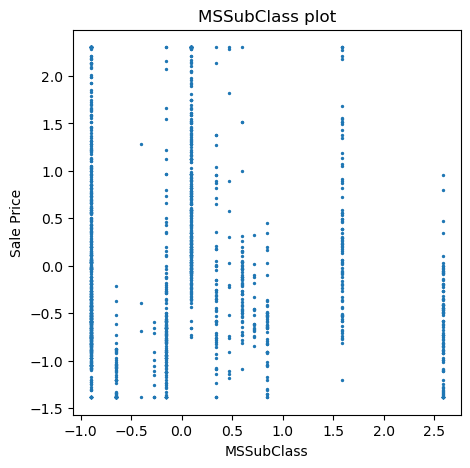

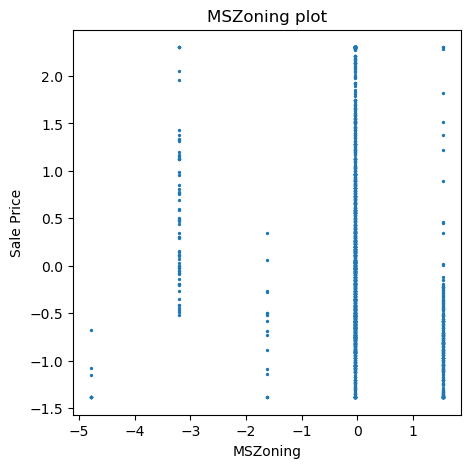

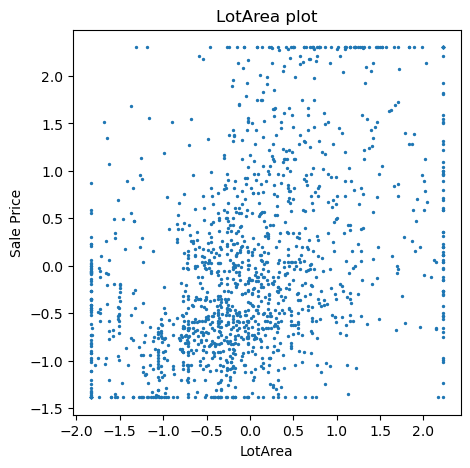

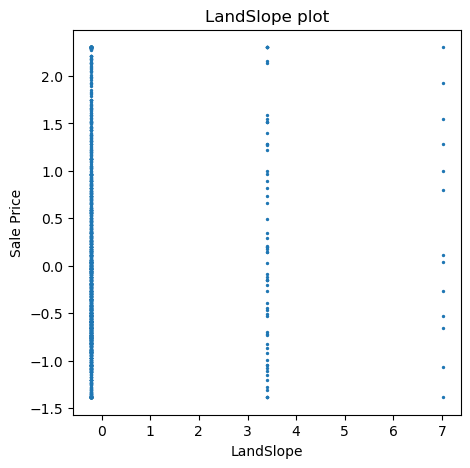

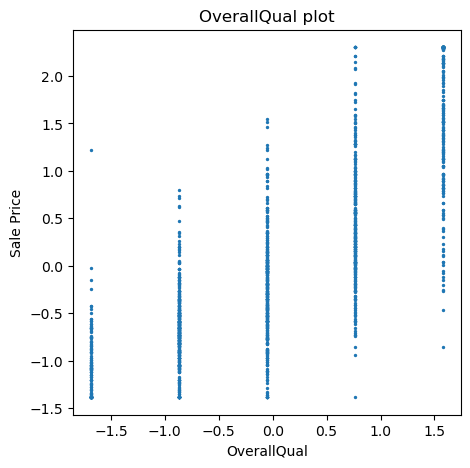

...

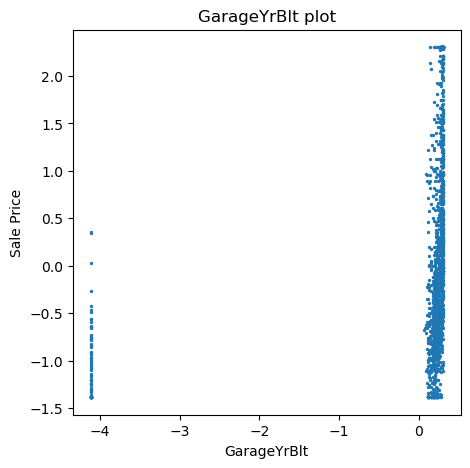

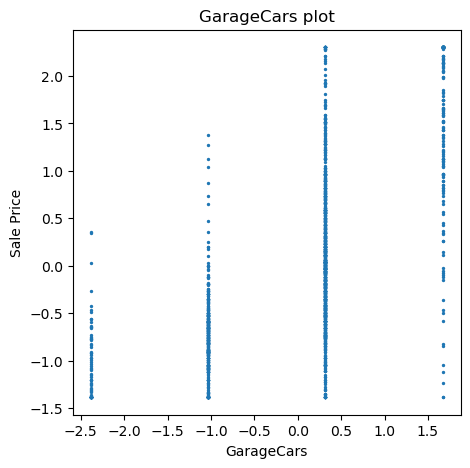

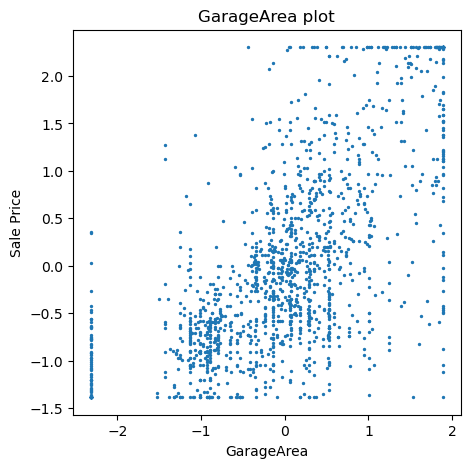

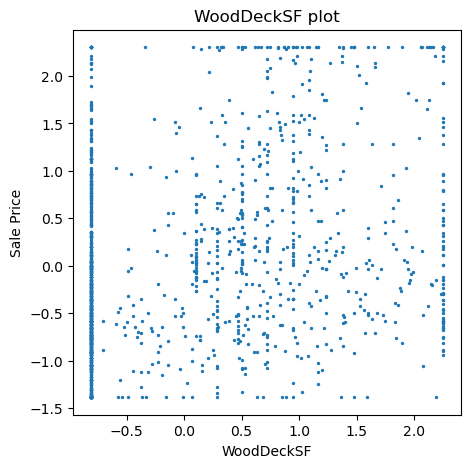

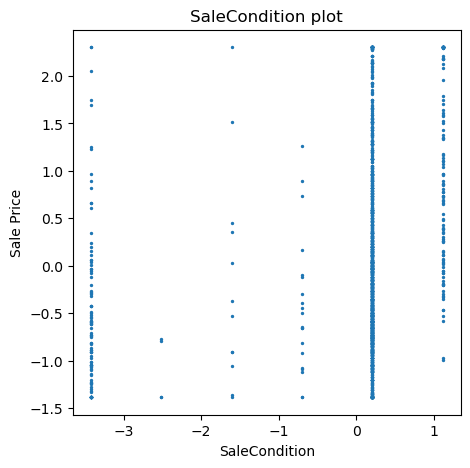

In [62]:
# Linearity -- Done on dataset not model
# Since this is multiple linear regression, we plot mulitple plot
# Plot for each variable
for i in X_test_new:
    plt.figure(figsize=(5,5))
    plt.scatter(X[i], y, s=2)
    plt.title(f'{i} plot')
    plt.xlabel(i)
    plt.ylabel('Sale Price')

## Homoscedasticity

Text(0, 0.5, 'Residuals')

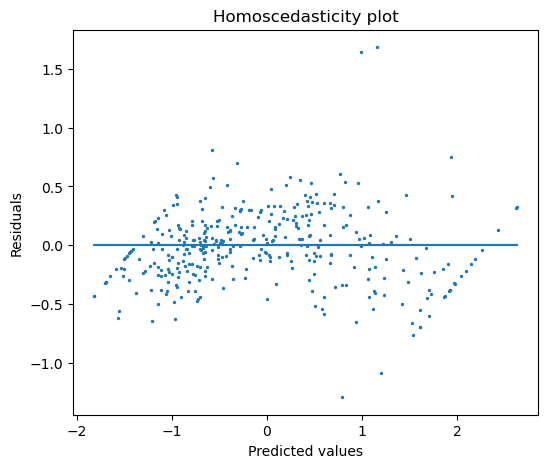

In [63]:
# In this assumotion, you are checking for the spreadedness of the
# residuals on the sides of a horizontal line at y=0
# You plot predicted values against residuals
# 1. Plot scree plot 2. Draw the y=0 line 3. Interpret line
residuals = y_pred - y_test
plt.figure(figsize=(6,5))
plt.scatter(y_pred, residuals, s=2)
# Plots x-values and 0 for each of their corresponding y coordinates
plt.plot(y_pred, [0]*len(y_pred))
plt.title('Homoscedasticity plot')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')

## Multicollinearity

In [64]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# vif method is one way to check for this
# vif > 10 -> Strong collinearity and vif < 5 -> Less collinearity

In [65]:
vif = [variance_inflation_factor(X_train_new.values, i) for i in range(X_train_new.shape[1])]
pd.DataFrame({'vif' : vif[0:]}, index=X_train_new.columns).T

,MSSubClass,MSZoning,LotArea,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,ExterQual,BsmtQual,BsmtUnfSF,TotalBsmtSF,HeatingQC,2ndFlrSF,GrLivArea,FullBath,BedroomAbvGr,KitchenQual,Functional,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,SaleCondition
vif,1.54056,1.194387,1.890905,1.114462,3.174274,1.639236,3.916053,2.543958,2.301336,2.248684,1.441909,4.243795,1.555219,5.653722,8.00613,2.378379,2.003628,1.971524,1.158242,1.517597,1.858758,6.486125,5.694595,1.212157,1.108384


## Normality

Text(0.5, 1.0, 'Normal Distribution Test')

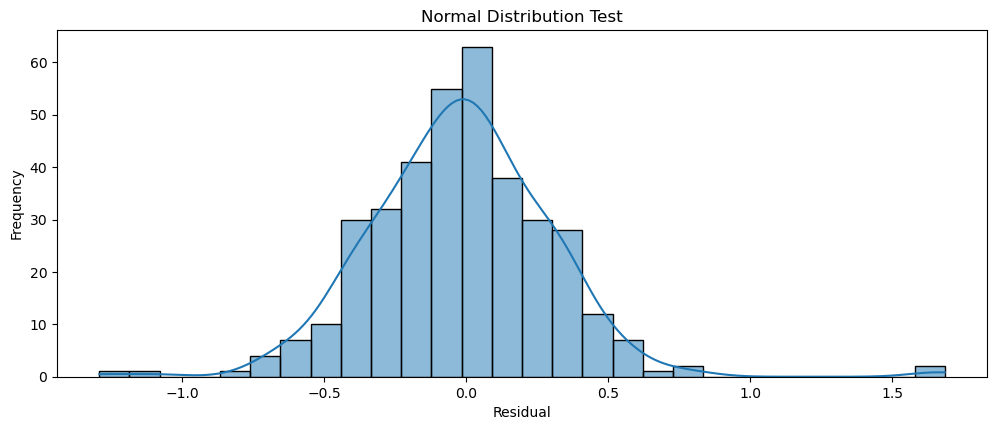

In [66]:
# residuals = y_train - y_pred
# Histplot and distplot are same in newer sns versions
# kde adds curve to the plot
# Histogram and barcharts are charts based on type of data
plt.figure(figsize=(12, 4.5))
sns.histplot(residuals, kde=True)
plt.xlabel('Residual')
plt.ylabel('Frequency')
plt.title('Normal Distribution Test')